In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST
from External.create_k_nearest import patch_together



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "pancreas_full"

threshold = 6

# for the filename
parameters = "2-0_5-t6"

In [6]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)

    
# Save the number of nodes (sometimes needed)
number_of_nodes = len(position)
    
# calculate the cluster centers and the components
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))    

cluster_centers, labels = k_means_pp(k, pca, metric=metric, return_labels=True)
unique_labels = np.unique(labels)


print("Time for data preperation: ", time.time()-start)

sklearn is done: 69.6560127735138
My own part is done: 3.1542816162109375
Time for data preperation:  216.55912590026855


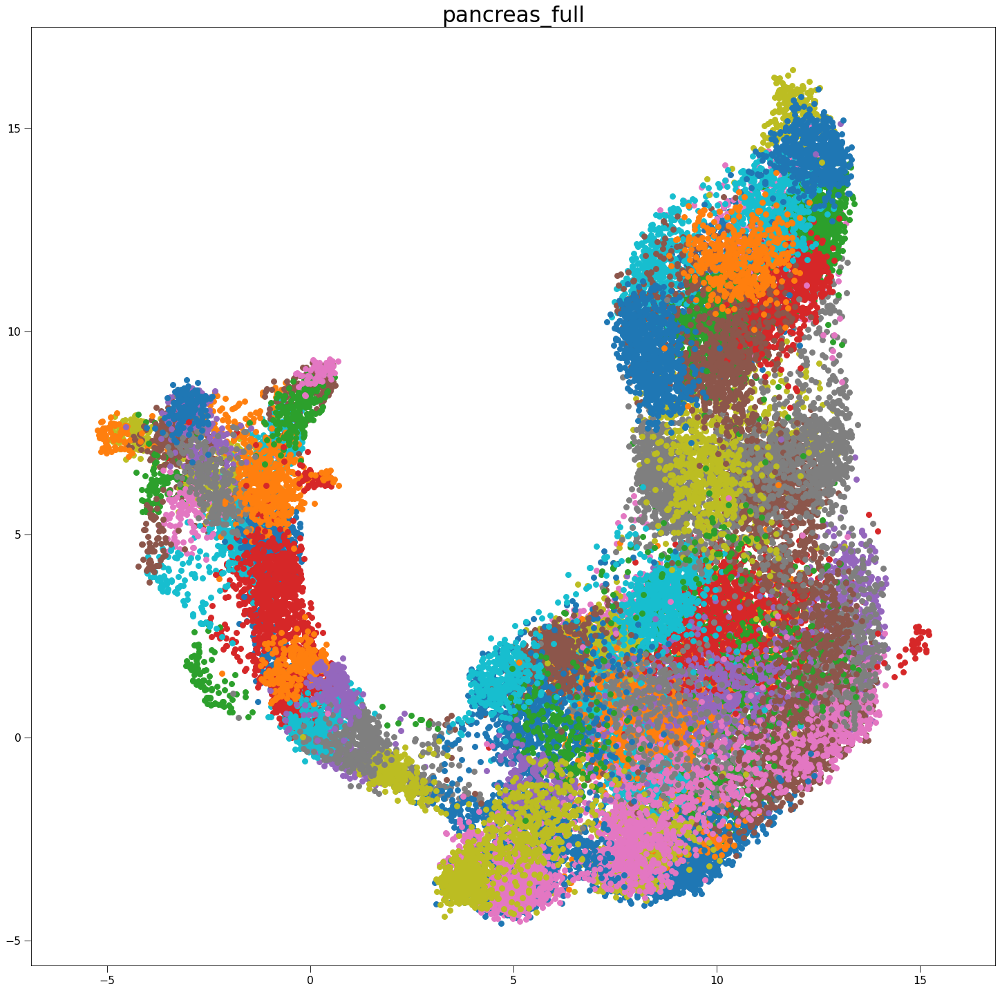

In [7]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
ax.get_legend().remove()
plt.show()

In [8]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=4,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/107 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/554 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1914 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1914 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1914 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/553 [00:00<?, ?it/s]

update Arr 1914 -> 1734
added 9 edges early
update Arr 1734 -> 1574
update Arr 1574 -> 1428
added 7 edges early
update Arr 1428 -> 1295
added 7 edges early
update Arr 1295 -> 1177
added 4 edges early
update Arr 1177 -> 1069
update Arr 1069 -> 969
update Arr 969 -> 879
update Arr 879 -> 798
update Arr 798 -> 724
update Arr 724 -> 658
update Arr 658 -> 597
update Arr 597 -> 563
update Arr 563 -> 560
added 2 edges early
update Arr 560 -> 560
update Arr 560 -> 558
update Arr 558 -> 553
added 4 edges early


calculating the densities for the density criterion:   0%|          | 0/681 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2340 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2340 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2340 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/680 [00:00<?, ?it/s]

update Arr 2340 -> 2124
added 10 edges early
update Arr 2124 -> 1926
added 5 edges early
update Arr 1926 -> 1746
added 8 edges early
update Arr 1746 -> 1581
added 12 edges early
update Arr 1581 -> 1435
added 5 edges early
update Arr 1435 -> 1303
update Arr 1303 -> 1183
update Arr 1183 -> 1074
update Arr 1074 -> 975
update Arr 975 -> 885
update Arr 885 -> 804
update Arr 804 -> 729
update Arr 729 -> 687
update Arr 687 -> 687
update Arr 687 -> 686
update Arr 686 -> 685
update Arr 685 -> 685
update Arr 685 -> 684
update Arr 684 -> 680
added 3 edges early


calculating the densities for the density criterion:   0%|          | 0/825 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2814 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2814 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2814 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/824 [00:00<?, ?it/s]

update Arr 2814 -> 2551
added 8 edges early
update Arr 2551 -> 2313
added 7 edges early
update Arr 2313 -> 2094
added 4 edges early
update Arr 2094 -> 1901
added 7 edges early
update Arr 1901 -> 1727
added 19 edges early
update Arr 1727 -> 1558
added 12 edges early
update Arr 1558 -> 1416
update Arr 1416 -> 1286
update Arr 1286 -> 1168
update Arr 1168 -> 1060
update Arr 1060 -> 961
update Arr 961 -> 873
update Arr 873 -> 833
added 2 edges early
update Arr 833 -> 833
update Arr 833 -> 832
update Arr 832 -> 832
update Arr 832 -> 827
update Arr 827 -> 827
update Arr 827 -> 826
update Arr 826 -> 825
update Arr 825 -> 824


calculating the densities for the density criterion:   0%|          | 0/204 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/701 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/701 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/701 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/203 [00:00<?, ?it/s]

update Arr 701 -> 628
update Arr 628 -> 567
update Arr 567 -> 511
added 2 edges early
update Arr 511 -> 464
update Arr 464 -> 421
update Arr 421 -> 382
update Arr 382 -> 347
update Arr 347 -> 315
update Arr 315 -> 285
update Arr 285 -> 259
update Arr 259 -> 234
update Arr 234 -> 213
update Arr 213 -> 212
update Arr 212 -> 211
update Arr 211 -> 208
update Arr 208 -> 205
update Arr 205 -> 205
update Arr 205 -> 204


calculating the densities for the density criterion:   0%|          | 0/268 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/932 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/932 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/932 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/267 [00:00<?, ?it/s]

update Arr 932 -> 841
added 2 edges early
update Arr 841 -> 755
update Arr 755 -> 686
update Arr 686 -> 623
update Arr 623 -> 566
update Arr 566 -> 513
update Arr 513 -> 466
update Arr 466 -> 423
update Arr 423 -> 383
update Arr 383 -> 348
update Arr 348 -> 315
update Arr 315 -> 285
update Arr 285 -> 275
update Arr 275 -> 274
update Arr 274 -> 271
update Arr 271 -> 271
update Arr 271 -> 270
update Arr 270 -> 269
update Arr 269 -> 268


calculating the densities for the density criterion:   0%|          | 0/101 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/348 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/348 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/348 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/100 [00:00<?, ?it/s]

update Arr 348 -> 314
update Arr 314 -> 285
update Arr 285 -> 258
update Arr 258 -> 232
update Arr 232 -> 209
update Arr 209 -> 189
update Arr 189 -> 171
update Arr 171 -> 154
update Arr 154 -> 139
update Arr 139 -> 126
update Arr 126 -> 114
update Arr 114 -> 109
update Arr 109 -> 108
update Arr 108 -> 107
update Arr 107 -> 105
update Arr 105 -> 101
update Arr 101 -> 101
update Arr 101 -> 100


calculating the densities for the density criterion:   0%|          | 0/682 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2325 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2325 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2325 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/681 [00:00<?, ?it/s]

update Arr 2325 -> 2112
added 7 edges early
update Arr 2112 -> 1916
added 3 edges early
update Arr 1916 -> 1739
added 6 edges early
update Arr 1739 -> 1579
added 9 edges early
update Arr 1579 -> 1435
update Arr 1435 -> 1304
update Arr 1304 -> 1184
update Arr 1184 -> 1075
update Arr 1075 -> 977
update Arr 977 -> 888
update Arr 888 -> 804
update Arr 804 -> 730
update Arr 730 -> 690
update Arr 690 -> 688
update Arr 688 -> 685
update Arr 685 -> 684
update Arr 684 -> 683
update Arr 683 -> 683
update Arr 683 -> 682


calculating the densities for the density criterion:   0%|          | 0/603 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2024 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2024 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2024 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/602 [00:00<?, ?it/s]

update Arr 2024 -> 1839
added 10 edges early
update Arr 1839 -> 1657
added 4 edges early
update Arr 1657 -> 1497
added 5 edges early
update Arr 1497 -> 1357
added 10 edges early
update Arr 1357 -> 1227
added 10 edges early
update Arr 1227 -> 1115
update Arr 1115 -> 1013
update Arr 1013 -> 920
update Arr 920 -> 834
update Arr 834 -> 758
update Arr 758 -> 689
update Arr 689 -> 624
added 3 edges early
update Arr 624 -> 611
update Arr 611 -> 610
update Arr 610 -> 607
update Arr 607 -> 604
update Arr 604 -> 604
update Arr 604 -> 603
update Arr 603 -> 603


calculating the densities for the density criterion:   0%|          | 0/204 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/687 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/687 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/687 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/203 [00:00<?, ?it/s]

update Arr 687 -> 624
added 2 edges early
update Arr 624 -> 565
update Arr 565 -> 511
update Arr 511 -> 464
update Arr 464 -> 421
update Arr 421 -> 381
update Arr 381 -> 345
update Arr 345 -> 311
update Arr 311 -> 282
update Arr 282 -> 254
update Arr 254 -> 230
update Arr 230 -> 212
update Arr 212 -> 210
update Arr 210 -> 205
update Arr 205 -> 205
update Arr 205 -> 204
update Arr 204 -> 203


calculating the densities for the density criterion:   0%|          | 0/588 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2030 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2030 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2030 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/587 [00:00<?, ?it/s]

update Arr 2030 -> 1845
added 8 edges early
update Arr 1845 -> 1677
added 3 edges early
update Arr 1677 -> 1523
added 7 edges early
update Arr 1523 -> 1380
added 5 edges early
update Arr 1380 -> 1254
update Arr 1254 -> 1139
update Arr 1139 -> 1035
update Arr 1035 -> 940
update Arr 940 -> 854
update Arr 854 -> 774
update Arr 774 -> 703
update Arr 703 -> 638
update Arr 638 -> 597
update Arr 597 -> 596
update Arr 596 -> 595
update Arr 595 -> 588
added 6 edges early
update Arr 588 -> 588


calculating the densities for the density criterion:   0%|          | 0/69 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/238 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/238 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/238 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 238 -> 216
added 2 edges early
update Arr 216 -> 195
update Arr 195 -> 174
update Arr 174 -> 157
update Arr 157 -> 142
update Arr 142 -> 129
update Arr 129 -> 117
update Arr 117 -> 106
update Arr 106 -> 94
update Arr 94 -> 80
update Arr 80 -> 78
update Arr 78 -> 75
update Arr 75 -> 75
update Arr 75 -> 71
update Arr 71 -> 70


calculating the densities for the density criterion:   0%|          | 0/266 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/925 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/925 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/925 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/265 [00:00<?, ?it/s]

update Arr 925 -> 837
added 3 edges early
update Arr 837 -> 760
update Arr 760 -> 684
update Arr 684 -> 620
update Arr 620 -> 562
update Arr 562 -> 509
update Arr 509 -> 462
update Arr 462 -> 419
update Arr 419 -> 379
update Arr 379 -> 344
update Arr 344 -> 311
update Arr 311 -> 280
update Arr 280 -> 275
update Arr 275 -> 274
update Arr 274 -> 269
update Arr 269 -> 269
update Arr 269 -> 268
update Arr 268 -> 268
update Arr 268 -> 267
update Arr 267 -> 266


calculating the densities for the density criterion:   0%|          | 0/636 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2175 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/635 [00:00<?, ?it/s]

update Arr 2175 -> 1966
added 13 edges early
update Arr 1966 -> 1786
added 2 edges early
update Arr 1786 -> 1619
added 11 edges early
update Arr 1619 -> 1471
added 11 edges early
update Arr 1471 -> 1335
added 9 edges early
update Arr 1335 -> 1207
added 11 edges early
update Arr 1207 -> 1097
update Arr 1097 -> 997
update Arr 997 -> 906
update Arr 906 -> 822
update Arr 822 -> 747
update Arr 747 -> 676
update Arr 676 -> 644
added 4 edges early
update Arr 644 -> 644
update Arr 644 -> 640
update Arr 640 -> 639
update Arr 639 -> 635
added 3 edges early


calculating the densities for the density criterion:   0%|          | 0/420 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1492 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1492 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1492 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/419 [00:00<?, ?it/s]

update Arr 1492 -> 1355
added 5 edges early
update Arr 1355 -> 1231
added 4 edges early
update Arr 1231 -> 1119
added 2 edges early
update Arr 1119 -> 1015
added 3 edges early
update Arr 1015 -> 922
update Arr 922 -> 837
update Arr 837 -> 760
update Arr 760 -> 689
update Arr 689 -> 625
update Arr 625 -> 568
update Arr 568 -> 516
update Arr 516 -> 469
update Arr 469 -> 429
update Arr 429 -> 428
update Arr 428 -> 422
added 2 edges early
update Arr 422 -> 422
update Arr 422 -> 421
update Arr 421 -> 420
update Arr 420 -> 420


calculating the densities for the density criterion:   0%|          | 0/66 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/222 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/222 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/222 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 222 -> 201
update Arr 201 -> 180
update Arr 180 -> 161
update Arr 161 -> 146
update Arr 146 -> 131
update Arr 131 -> 118
update Arr 118 -> 107
update Arr 107 -> 95
update Arr 95 -> 83
update Arr 83 -> 72
added 3 edges early
update Arr 72 -> 72
update Arr 72 -> 71
update Arr 71 -> 66
added 2 edges early
update Arr 66 -> 66
update Arr 66 -> 65


calculating the densities for the density criterion:   0%|          | 0/229 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/824 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/824 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/824 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/228 [00:00<?, ?it/s]

update Arr 824 -> 744
added 2 edges early
update Arr 744 -> 676
update Arr 676 -> 608
added 3 edges early
update Arr 608 -> 552
update Arr 552 -> 501
update Arr 501 -> 454
update Arr 454 -> 412
update Arr 412 -> 372
update Arr 372 -> 338
update Arr 338 -> 305
update Arr 305 -> 276
update Arr 276 -> 250
update Arr 250 -> 236
added 3 edges early
update Arr 236 -> 236
update Arr 236 -> 234
update Arr 234 -> 229
added 2 edges early
update Arr 229 -> 229
update Arr 229 -> 228


calculating the densities for the density criterion:   0%|          | 0/516 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1747 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1747 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1747 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/515 [00:00<?, ?it/s]

update Arr 1747 -> 1587
added 7 edges early
update Arr 1587 -> 1436
added 2 edges early
update Arr 1436 -> 1303
added 7 edges early
update Arr 1303 -> 1183
added 6 edges early
update Arr 1183 -> 1067
added 9 edges early
update Arr 1067 -> 969
update Arr 969 -> 880
update Arr 880 -> 797
update Arr 797 -> 724
update Arr 724 -> 658
update Arr 658 -> 597
update Arr 597 -> 542
update Arr 542 -> 524
update Arr 524 -> 524
update Arr 524 -> 523
update Arr 523 -> 521
update Arr 521 -> 520
update Arr 520 -> 516
added 3 edges early
update Arr 516 -> 516


calculating the densities for the density criterion:   0%|          | 0/483 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1731 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1731 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1731 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/482 [00:00<?, ?it/s]

update Arr 1731 -> 1570
added 5 edges early
update Arr 1570 -> 1425
update Arr 1425 -> 1294
added 4 edges early
update Arr 1294 -> 1170
added 4 edges early
update Arr 1170 -> 1063
update Arr 1063 -> 965
update Arr 965 -> 876
update Arr 876 -> 796
update Arr 796 -> 723
update Arr 723 -> 656
update Arr 656 -> 595
update Arr 595 -> 538
update Arr 538 -> 492
update Arr 492 -> 491
update Arr 491 -> 484
added 3 edges early
update Arr 484 -> 484
update Arr 484 -> 483
update Arr 483 -> 482


calculating the densities for the density criterion:   0%|          | 0/278 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/930 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/930 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/930 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/277 [00:00<?, ?it/s]

update Arr 930 -> 845
added 6 edges early
update Arr 845 -> 766
update Arr 766 -> 696
added 3 edges early
update Arr 696 -> 631
added 3 edges early
update Arr 631 -> 573
update Arr 573 -> 519
update Arr 519 -> 470
update Arr 470 -> 424
update Arr 424 -> 384
update Arr 384 -> 347
update Arr 347 -> 315
update Arr 315 -> 287
update Arr 287 -> 286
update Arr 286 -> 286
update Arr 286 -> 283
update Arr 283 -> 282
update Arr 282 -> 278
added 3 edges early
update Arr 278 -> 278


calculating the densities for the density criterion:   0%|          | 0/854 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3015 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3015 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3015 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/853 [00:00<?, ?it/s]

update Arr 3015 -> 2729
added 12 edges early
update Arr 2729 -> 2479
added 3 edges early
update Arr 2479 -> 2248
added 10 edges early
update Arr 2248 -> 2042
added 18 edges early
update Arr 2042 -> 1856
added 5 edges early
update Arr 1856 -> 1686
update Arr 1686 -> 1532
update Arr 1532 -> 1391
update Arr 1391 -> 1263
update Arr 1263 -> 1147
update Arr 1147 -> 1042
update Arr 1042 -> 947
update Arr 947 -> 861
added 4 edges early
update Arr 861 -> 861
update Arr 861 -> 855
added 5 edges early
update Arr 855 -> 855
update Arr 855 -> 854


calculating the densities for the density criterion:   0%|          | 0/249 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/894 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/894 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/894 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/248 [00:00<?, ?it/s]

update Arr 894 -> 804
added 3 edges early
update Arr 804 -> 721
added 3 edges early
update Arr 721 -> 655
added 2 edges early
update Arr 655 -> 589
update Arr 589 -> 535
update Arr 535 -> 486
update Arr 486 -> 441
update Arr 441 -> 400
update Arr 400 -> 363
update Arr 363 -> 328
update Arr 328 -> 298
update Arr 298 -> 269
update Arr 269 -> 254
added 2 edges early
update Arr 254 -> 254
update Arr 254 -> 253
update Arr 253 -> 253
update Arr 253 -> 252
update Arr 252 -> 251
update Arr 251 -> 250
update Arr 250 -> 249


calculating the densities for the density criterion:   0%|          | 0/290 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1013 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1013 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1013 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/289 [00:00<?, ?it/s]

update Arr 1013 -> 920
update Arr 920 -> 833
added 2 edges early
update Arr 833 -> 755
update Arr 755 -> 685
added 4 edges early
update Arr 685 -> 622
update Arr 622 -> 563
update Arr 563 -> 510
update Arr 510 -> 463
update Arr 463 -> 419
update Arr 419 -> 379
update Arr 379 -> 343
update Arr 343 -> 311
update Arr 311 -> 298
update Arr 298 -> 298
update Arr 298 -> 297
update Arr 297 -> 297
update Arr 297 -> 296
update Arr 296 -> 295
update Arr 295 -> 295
update Arr 295 -> 294
update Arr 294 -> 293
update Arr 293 -> 292
update Arr 292 -> 291
update Arr 291 -> 290


calculating the densities for the density criterion:   0%|          | 0/575 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1982 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1982 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1982 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/574 [00:00<?, ?it/s]

update Arr 1982 -> 1800
added 6 edges early
update Arr 1800 -> 1631
added 5 edges early
update Arr 1631 -> 1481
added 6 edges early
update Arr 1481 -> 1339
added 5 edges early
update Arr 1339 -> 1216
update Arr 1216 -> 1103
update Arr 1103 -> 1001
update Arr 1001 -> 909
update Arr 909 -> 825
update Arr 825 -> 746
update Arr 746 -> 678
update Arr 678 -> 615
update Arr 615 -> 581
update Arr 581 -> 581
update Arr 581 -> 580
update Arr 580 -> 579
update Arr 579 -> 576
update Arr 576 -> 576
update Arr 576 -> 575


calculating the densities for the density criterion:   0%|          | 0/490 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1648 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1648 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1648 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/489 [00:00<?, ?it/s]

update Arr 1648 -> 1498
added 4 edges early
update Arr 1498 -> 1358
added 5 edges early
update Arr 1358 -> 1229
added 2 edges early
update Arr 1229 -> 1117
added 6 edges early
update Arr 1117 -> 1014
update Arr 1014 -> 921
update Arr 921 -> 837
update Arr 837 -> 760
update Arr 760 -> 690
update Arr 690 -> 625
update Arr 625 -> 567
update Arr 567 -> 515
update Arr 515 -> 497
update Arr 497 -> 495
update Arr 495 -> 495
update Arr 495 -> 494
update Arr 494 -> 494
update Arr 494 -> 489
added 4 edges early


calculating the densities for the density criterion:   0%|          | 0/158 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/538 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/538 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/538 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/157 [00:00<?, ?it/s]

update Arr 538 -> 486
update Arr 486 -> 440
update Arr 440 -> 399
update Arr 399 -> 359
added 3 edges early
update Arr 359 -> 326
update Arr 326 -> 295
update Arr 295 -> 268
update Arr 268 -> 243
update Arr 243 -> 220
update Arr 220 -> 199
update Arr 199 -> 179
update Arr 179 -> 167
update Arr 167 -> 166
update Arr 166 -> 163
update Arr 163 -> 163
update Arr 163 -> 162
update Arr 162 -> 161
update Arr 161 -> 158
added 2 edges early
update Arr 158 -> 158


calculating the densities for the density criterion:   0%|          | 0/8 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/21 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/21 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/21 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/7 [00:00<?, ?it/s]

update Arr 21 -> 18
update Arr 18 -> 16
update Arr 16 -> 12
update Arr 12 -> 11
update Arr 11 -> 9
update Arr 9 -> 8


calculating the densities for the density criterion:   0%|          | 0/59 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/193 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/193 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/193 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 193 -> 174
update Arr 174 -> 151
update Arr 151 -> 137
update Arr 137 -> 123
update Arr 123 -> 111
update Arr 111 -> 100
update Arr 100 -> 89
update Arr 89 -> 80
update Arr 80 -> 70
added 2 edges early
update Arr 70 -> 68
update Arr 68 -> 65
update Arr 65 -> 60
update Arr 60 -> 60
update Arr 60 -> 59
update Arr 59 -> 58


calculating the densities for the density criterion:   0%|          | 0/56 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/186 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/186 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/186 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 186 -> 150
added 7 edges early
update Arr 150 -> 131
update Arr 131 -> 117
added 2 edges early
update Arr 117 -> 105
update Arr 105 -> 93
update Arr 93 -> 82
update Arr 82 -> 73
update Arr 73 -> 65
update Arr 65 -> 64
update Arr 64 -> 63
update Arr 63 -> 62
update Arr 62 -> 58
update Arr 58 -> 58
update Arr 58 -> 57
update Arr 57 -> 57
update Arr 57 -> 56


calculating the densities for the density criterion:   0%|          | 0/319 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1075 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1075 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1075 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/318 [00:00<?, ?it/s]

update Arr 1075 -> 977
added 9 edges early
update Arr 977 -> 887
added 2 edges early
update Arr 887 -> 805
added 4 edges early
update Arr 805 -> 731
added 5 edges early
update Arr 731 -> 664
update Arr 664 -> 603
update Arr 603 -> 548
update Arr 548 -> 497
update Arr 497 -> 450
update Arr 450 -> 408
update Arr 408 -> 369
update Arr 369 -> 335
update Arr 335 -> 328
update Arr 328 -> 326
update Arr 326 -> 326
update Arr 326 -> 321
added 2 edges early
update Arr 321 -> 321
update Arr 321 -> 320
update Arr 320 -> 320


calculating the densities for the density criterion:   0%|          | 0/333 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1111 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/332 [00:00<?, ?it/s]

update Arr 1111 -> 1005
added 4 edges early
update Arr 1005 -> 907
added 2 edges early
update Arr 907 -> 824
update Arr 824 -> 745
added 3 edges early
update Arr 745 -> 677
update Arr 677 -> 615
update Arr 615 -> 559
update Arr 559 -> 508
update Arr 508 -> 461
update Arr 461 -> 418
update Arr 418 -> 378
update Arr 378 -> 338
update Arr 338 -> 337
update Arr 337 -> 336
update Arr 336 -> 336
update Arr 336 -> 334
update Arr 334 -> 333
update Arr 333 -> 333


calculating the densities for the density criterion:   0%|          | 0/212 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/692 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/692 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/692 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/211 [00:00<?, ?it/s]

update Arr 692 -> 622
added 3 edges early
update Arr 622 -> 562
update Arr 562 -> 510
added 5 edges early
update Arr 510 -> 456
added 3 edges early
update Arr 456 -> 413
update Arr 413 -> 375
update Arr 375 -> 338
update Arr 338 -> 307
update Arr 307 -> 279
update Arr 279 -> 252
update Arr 252 -> 229
update Arr 229 -> 221
update Arr 221 -> 219
update Arr 219 -> 216
update Arr 216 -> 212
added 2 edges early
update Arr 212 -> 212
update Arr 212 -> 211


calculating the densities for the density criterion:   0%|          | 0/622 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2085 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2085 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2085 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/621 [00:00<?, ?it/s]

update Arr 2085 -> 1891
added 14 edges early
update Arr 1891 -> 1714
added 2 edges early
update Arr 1714 -> 1558
added 10 edges early
update Arr 1558 -> 1413
added 6 edges early
update Arr 1413 -> 1284
update Arr 1284 -> 1166
update Arr 1166 -> 1058
update Arr 1058 -> 961
update Arr 961 -> 871
update Arr 871 -> 791
update Arr 791 -> 718
update Arr 718 -> 652
update Arr 652 -> 631
update Arr 631 -> 629
update Arr 629 -> 628
update Arr 628 -> 622
added 2 edges early
update Arr 622 -> 622
update Arr 622 -> 621


calculating the densities for the density criterion:   0%|          | 0/299 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1002 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1002 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1002 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/298 [00:00<?, ?it/s]

update Arr 1002 -> 910
added 5 edges early
update Arr 910 -> 824
added 2 edges early
update Arr 824 -> 749
update Arr 749 -> 677
added 2 edges early
update Arr 677 -> 615
update Arr 615 -> 559
update Arr 559 -> 507
update Arr 507 -> 459
update Arr 459 -> 416
update Arr 416 -> 378
update Arr 378 -> 342
update Arr 342 -> 304
update Arr 304 -> 304
update Arr 304 -> 303
update Arr 303 -> 302
update Arr 302 -> 301
update Arr 301 -> 300
update Arr 300 -> 299
update Arr 299 -> 298


calculating the densities for the density criterion:   0%|          | 0/724 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2453 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2453 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2453 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/723 [00:00<?, ?it/s]

update Arr 2453 -> 2217
added 9 edges early
update Arr 2217 -> 2000
added 5 edges early
update Arr 2000 -> 1816
added 9 edges early
update Arr 1816 -> 1649
added 9 edges early
update Arr 1649 -> 1493
added 12 edges early
update Arr 1493 -> 1357
update Arr 1357 -> 1233
update Arr 1233 -> 1120
update Arr 1120 -> 1016
update Arr 1016 -> 923
update Arr 923 -> 836
update Arr 836 -> 759
update Arr 759 -> 732
update Arr 732 -> 731
update Arr 731 -> 730
update Arr 730 -> 728
update Arr 728 -> 724
added 3 edges early
update Arr 724 -> 724


calculating the densities for the density criterion:   0%|          | 0/578 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2041 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2041 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2041 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/577 [00:00<?, ?it/s]

update Arr 2041 -> 1848
added 9 edges early
update Arr 1848 -> 1673
added 3 edges early
update Arr 1673 -> 1518
added 3 edges early
update Arr 1518 -> 1375
added 6 edges early
update Arr 1375 -> 1248
update Arr 1248 -> 1133
update Arr 1133 -> 1029
update Arr 1029 -> 935
update Arr 935 -> 846
update Arr 846 -> 767
update Arr 767 -> 697
update Arr 697 -> 631
update Arr 631 -> 587
update Arr 587 -> 586
update Arr 586 -> 585
update Arr 585 -> 585
update Arr 585 -> 580
added 2 edges early
update Arr 580 -> 580
update Arr 580 -> 579
update Arr 579 -> 579
update Arr 579 -> 578


calculating the densities for the density criterion:   0%|          | 0/126 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/424 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/424 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/424 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/125 [00:00<?, ?it/s]

update Arr 424 -> 385
update Arr 385 -> 349
update Arr 349 -> 312
added 3 edges early
update Arr 312 -> 283
update Arr 283 -> 257
update Arr 257 -> 232
update Arr 232 -> 210
update Arr 210 -> 190
update Arr 190 -> 170
update Arr 170 -> 153
update Arr 153 -> 138
update Arr 138 -> 135
update Arr 135 -> 134
update Arr 134 -> 132
update Arr 132 -> 130
update Arr 130 -> 130
update Arr 130 -> 127
update Arr 127 -> 127
update Arr 127 -> 126


calculating the densities for the density criterion:   0%|          | 0/589 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2012 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2012 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2012 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/588 [00:00<?, ?it/s]

update Arr 2012 -> 1822
added 13 edges early
update Arr 1822 -> 1652
added 3 edges early
update Arr 1652 -> 1500
update Arr 1500 -> 1361
added 12 edges early
update Arr 1361 -> 1236
added 13 edges early
update Arr 1236 -> 1123
update Arr 1123 -> 1019
update Arr 1019 -> 926
update Arr 926 -> 840
update Arr 840 -> 763
update Arr 763 -> 693
update Arr 693 -> 629
update Arr 629 -> 598
update Arr 598 -> 596
update Arr 596 -> 595
update Arr 595 -> 594
update Arr 594 -> 591
update Arr 591 -> 590
update Arr 590 -> 589
update Arr 589 -> 589


calculating the densities for the density criterion:   0%|          | 0/593 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2057 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2057 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2057 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/592 [00:00<?, ?it/s]

update Arr 2057 -> 1853
added 7 edges early
update Arr 1853 -> 1684
added 4 edges early
update Arr 1684 -> 1529
added 7 edges early
update Arr 1529 -> 1389
added 5 edges early
update Arr 1389 -> 1262
update Arr 1262 -> 1147
update Arr 1147 -> 1042
update Arr 1042 -> 946
update Arr 946 -> 857
update Arr 857 -> 779
update Arr 779 -> 705
update Arr 705 -> 637
update Arr 637 -> 601
update Arr 601 -> 601
update Arr 601 -> 600
update Arr 600 -> 594
added 5 edges early
update Arr 594 -> 594
update Arr 594 -> 593


calculating the densities for the density criterion:   0%|          | 0/291 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1006 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1006 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1006 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/290 [00:00<?, ?it/s]

update Arr 1006 -> 912
added 3 edges early
update Arr 912 -> 827
update Arr 827 -> 750
added 5 edges early
update Arr 750 -> 677
added 2 edges early
update Arr 677 -> 615
update Arr 615 -> 559
update Arr 559 -> 508
update Arr 508 -> 461
update Arr 461 -> 417
update Arr 417 -> 379
update Arr 379 -> 343
update Arr 343 -> 311
update Arr 311 -> 297
update Arr 297 -> 296
update Arr 296 -> 293
added 2 edges early
update Arr 293 -> 293
update Arr 293 -> 292
update Arr 292 -> 291


calculating the densities for the density criterion:   0%|          | 0/40 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/132 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 132 -> 117
update Arr 117 -> 105
update Arr 105 -> 93
update Arr 93 -> 83
update Arr 83 -> 74
update Arr 74 -> 67
update Arr 67 -> 59
update Arr 59 -> 52
update Arr 52 -> 49
update Arr 49 -> 47
update Arr 47 -> 45
update Arr 45 -> 43
update Arr 43 -> 42
update Arr 42 -> 40
update Arr 40 -> 40


calculating the densities for the density criterion:   0%|          | 0/620 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2103 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2103 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2103 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/619 [00:00<?, ?it/s]

update Arr 2103 -> 1897
added 5 edges early
update Arr 1897 -> 1724
update Arr 1724 -> 1563
added 9 edges early
update Arr 1563 -> 1419
added 12 edges early
update Arr 1419 -> 1287
added 10 edges early
update Arr 1287 -> 1168
update Arr 1168 -> 1061
update Arr 1061 -> 964
update Arr 964 -> 876
update Arr 876 -> 796
update Arr 796 -> 723
update Arr 723 -> 656
update Arr 656 -> 629
update Arr 629 -> 629
update Arr 629 -> 628
update Arr 628 -> 627
update Arr 627 -> 627
update Arr 627 -> 626
update Arr 626 -> 625
update Arr 625 -> 623
update Arr 623 -> 619
added 3 edges early


calculating the densities for the density criterion:   0%|          | 0/140 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/487 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/487 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/487 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/139 [00:00<?, ?it/s]

update Arr 487 -> 442
update Arr 442 -> 401
update Arr 401 -> 362
update Arr 362 -> 329
update Arr 329 -> 299
update Arr 299 -> 271
update Arr 271 -> 243
update Arr 243 -> 218
update Arr 218 -> 196
update Arr 196 -> 177
update Arr 177 -> 160
added 3 edges early
update Arr 160 -> 149
update Arr 149 -> 142
added 4 edges early
update Arr 142 -> 142
update Arr 142 -> 141
update Arr 141 -> 140


calculating the densities for the density criterion:   0%|          | 0/226 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/725 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/725 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/725 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/225 [00:00<?, ?it/s]

update Arr 725 -> 655
added 3 edges early
update Arr 655 -> 593
added 2 edges early
update Arr 593 -> 539
added 3 edges early
update Arr 539 -> 488
update Arr 488 -> 442
update Arr 442 -> 399
update Arr 399 -> 362
update Arr 362 -> 329
update Arr 329 -> 299
update Arr 299 -> 268
update Arr 268 -> 243
update Arr 243 -> 233
update Arr 233 -> 231
update Arr 231 -> 230
update Arr 230 -> 227
update Arr 227 -> 227
update Arr 227 -> 225


calculating the densities for the density criterion:   0%|          | 0/127 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/448 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/448 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/448 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/126 [00:00<?, ?it/s]

update Arr 448 -> 404
added 3 edges early
update Arr 404 -> 363
update Arr 363 -> 327
update Arr 327 -> 297
update Arr 297 -> 269
update Arr 269 -> 243
update Arr 243 -> 220
update Arr 220 -> 198
update Arr 198 -> 177
update Arr 177 -> 159
update Arr 159 -> 144
update Arr 144 -> 136
update Arr 136 -> 134
update Arr 134 -> 134
update Arr 134 -> 128
added 2 edges early
update Arr 128 -> 128
update Arr 128 -> 127
update Arr 127 -> 127


calculating the densities for the density criterion:   0%|          | 0/341 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1130 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1130 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1130 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/340 [00:00<?, ?it/s]

update Arr 1130 -> 1022
added 2 edges early
update Arr 1022 -> 923
added 2 edges early
update Arr 923 -> 837
added 6 edges early
update Arr 837 -> 758
added 8 edges early
update Arr 758 -> 679
added 6 edges early
update Arr 679 -> 616
update Arr 616 -> 558
update Arr 558 -> 507
update Arr 507 -> 460
update Arr 460 -> 418
update Arr 418 -> 376
update Arr 376 -> 350
update Arr 350 -> 349
update Arr 349 -> 346
update Arr 346 -> 342
update Arr 342 -> 342
update Arr 342 -> 341
update Arr 341 -> 341


calculating the densities for the density criterion:   0%|          | 0/15 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/46 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/46 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/46 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/14 [00:00<?, ?it/s]

update Arr 46 -> 40
update Arr 40 -> 36
update Arr 36 -> 32
update Arr 32 -> 28
update Arr 28 -> 23
update Arr 23 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 17
update Arr 17 -> 15


calculating the densities for the density criterion:   0%|          | 0/543 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1855 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1855 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1855 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/542 [00:00<?, ?it/s]

update Arr 1855 -> 1683
added 7 edges early
update Arr 1683 -> 1527
added 3 edges early
update Arr 1527 -> 1386
added 4 edges early
update Arr 1386 -> 1255
added 9 edges early
update Arr 1255 -> 1135
added 8 edges early
update Arr 1135 -> 1030
update Arr 1030 -> 936
update Arr 936 -> 850
update Arr 850 -> 771
update Arr 771 -> 699
update Arr 699 -> 635
update Arr 635 -> 573
added 2 edges early
update Arr 573 -> 551
update Arr 551 -> 550
update Arr 550 -> 550
update Arr 550 -> 544
added 5 edges early
update Arr 544 -> 544
update Arr 544 -> 543


calculating the densities for the density criterion:   0%|          | 0/478 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1612 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1612 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1612 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/477 [00:00<?, ?it/s]

update Arr 1612 -> 1458
added 4 edges early
update Arr 1458 -> 1321
added 6 edges early
update Arr 1321 -> 1187
added 7 edges early
update Arr 1187 -> 1079
added 9 edges early
update Arr 1079 -> 979
added 6 edges early
update Arr 979 -> 889
update Arr 889 -> 808
update Arr 808 -> 734
update Arr 734 -> 666
update Arr 666 -> 605
update Arr 605 -> 546
update Arr 546 -> 496
update Arr 496 -> 486
update Arr 486 -> 485
update Arr 485 -> 483
update Arr 483 -> 481
update Arr 481 -> 477
added 3 edges early


calculating the densities for the density criterion:   0%|          | 0/464 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1537 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1537 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1537 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/463 [00:00<?, ?it/s]

update Arr 1537 -> 1395
added 7 edges early
update Arr 1395 -> 1265
update Arr 1265 -> 1148
added 7 edges early
update Arr 1148 -> 1042
added 2 edges early
update Arr 1042 -> 947
update Arr 947 -> 860
update Arr 860 -> 781
update Arr 781 -> 709
update Arr 709 -> 643
update Arr 643 -> 581
update Arr 581 -> 527
update Arr 527 -> 478
update Arr 478 -> 472
update Arr 472 -> 471
update Arr 471 -> 471
update Arr 471 -> 466
added 2 edges early
update Arr 466 -> 466
update Arr 466 -> 465
update Arr 465 -> 465
update Arr 465 -> 464


calculating the densities for the density criterion:   0%|          | 0/153 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/526 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/526 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/526 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/152 [00:00<?, ?it/s]

update Arr 526 -> 478
update Arr 478 -> 433
update Arr 433 -> 392
update Arr 392 -> 356
update Arr 356 -> 323
update Arr 323 -> 292
update Arr 292 -> 264
update Arr 264 -> 238
update Arr 238 -> 215
update Arr 215 -> 194
update Arr 194 -> 176
update Arr 176 -> 160
update Arr 160 -> 160
update Arr 160 -> 159
update Arr 159 -> 158
update Arr 158 -> 156
update Arr 156 -> 154
update Arr 154 -> 153
update Arr 153 -> 153


calculating the densities for the density criterion:   0%|          | 0/350 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1149 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/349 [00:00<?, ?it/s]

update Arr 1149 -> 1042
added 7 edges early
update Arr 1042 -> 944
added 4 edges early
update Arr 944 -> 857
added 2 edges early
update Arr 857 -> 774
added 6 edges early
update Arr 774 -> 703
update Arr 703 -> 638
update Arr 638 -> 579
update Arr 579 -> 525
update Arr 525 -> 477
update Arr 477 -> 433
update Arr 433 -> 389
update Arr 389 -> 353
added 2 edges early
update Arr 353 -> 353
update Arr 353 -> 352
update Arr 352 -> 351
update Arr 351 -> 350
update Arr 350 -> 350


calculating the densities for the density criterion:   0%|          | 0/94 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/282 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/282 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/282 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/93 [00:00<?, ?it/s]

update Arr 282 -> 255
update Arr 255 -> 230
update Arr 230 -> 208
update Arr 208 -> 188
update Arr 188 -> 170
update Arr 170 -> 154
update Arr 154 -> 137
update Arr 137 -> 124
update Arr 124 -> 109
update Arr 109 -> 101
update Arr 101 -> 98
update Arr 98 -> 97
update Arr 97 -> 95
update Arr 95 -> 93


calculating the densities for the density criterion:   0%|          | 0/478 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1639 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1639 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1639 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/477 [00:00<?, ?it/s]

update Arr 1639 -> 1483
added 6 edges early
update Arr 1483 -> 1343
update Arr 1343 -> 1219
added 2 edges early
update Arr 1219 -> 1096
added 3 edges early
update Arr 1096 -> 996
update Arr 996 -> 905
update Arr 905 -> 821
update Arr 821 -> 744
update Arr 744 -> 676
update Arr 676 -> 612
update Arr 612 -> 556
update Arr 556 -> 504
update Arr 504 -> 485
update Arr 485 -> 485
update Arr 485 -> 484
update Arr 484 -> 483
update Arr 483 -> 480
update Arr 480 -> 480
update Arr 480 -> 478


calculating the densities for the density criterion:   0%|          | 0/608 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2079 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2079 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2079 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/607 [00:00<?, ?it/s]

update Arr 2079 -> 1888
added 8 edges early
update Arr 1888 -> 1714
added 6 edges early
update Arr 1714 -> 1552
added 4 edges early
update Arr 1552 -> 1408
added 12 edges early
update Arr 1408 -> 1276
added 13 edges early
update Arr 1276 -> 1159
update Arr 1159 -> 1052
update Arr 1052 -> 955
update Arr 955 -> 868
update Arr 868 -> 789
update Arr 789 -> 717
update Arr 717 -> 650
update Arr 650 -> 617
update Arr 617 -> 617
update Arr 617 -> 611
update Arr 611 -> 611
update Arr 611 -> 610
update Arr 610 -> 610
update Arr 610 -> 609
update Arr 609 -> 608
update Arr 608 -> 608


calculating the densities for the density criterion:   0%|          | 0/186 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/642 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/642 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/642 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/185 [00:00<?, ?it/s]

update Arr 642 -> 575
update Arr 575 -> 522
added 2 edges early
update Arr 522 -> 472
update Arr 472 -> 427
update Arr 427 -> 388
update Arr 388 -> 352
update Arr 352 -> 317
update Arr 317 -> 287
update Arr 287 -> 260
update Arr 260 -> 236
update Arr 236 -> 212
update Arr 212 -> 192
update Arr 192 -> 192
update Arr 192 -> 191
update Arr 191 -> 191
update Arr 191 -> 190
update Arr 190 -> 189
update Arr 189 -> 188
update Arr 188 -> 187
update Arr 187 -> 186


calculating the densities for the density criterion:   0%|          | 0/23 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/72 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/72 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/72 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 72 -> 64
update Arr 64 -> 57
update Arr 57 -> 49
update Arr 49 -> 40
update Arr 40 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 28
update Arr 28 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22


calculating the densities for the density criterion:   0%|          | 0/183 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/655 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/655 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/655 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/182 [00:00<?, ?it/s]

update Arr 655 -> 593
added 2 edges early
update Arr 593 -> 529
update Arr 529 -> 478
update Arr 478 -> 434
update Arr 434 -> 394
update Arr 394 -> 355
update Arr 355 -> 322
update Arr 322 -> 291
update Arr 291 -> 263
update Arr 263 -> 239
update Arr 239 -> 216
update Arr 216 -> 196
update Arr 196 -> 191
update Arr 191 -> 190
update Arr 190 -> 188
update Arr 188 -> 188
update Arr 188 -> 187
update Arr 187 -> 186
update Arr 186 -> 184
update Arr 184 -> 183


calculating the densities for the density criterion:   0%|          | 0/580 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1965 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1965 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1965 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/579 [00:00<?, ?it/s]

update Arr 1965 -> 1784
added 3 edges early
update Arr 1784 -> 1617
added 3 edges early
update Arr 1617 -> 1469
added 2 edges early
update Arr 1469 -> 1325
added 4 edges early
update Arr 1325 -> 1203
update Arr 1203 -> 1093
update Arr 1093 -> 992
update Arr 992 -> 901
update Arr 901 -> 819
update Arr 819 -> 744
update Arr 744 -> 675
update Arr 675 -> 613
update Arr 613 -> 589
added 4 edges early
update Arr 589 -> 589
update Arr 589 -> 588
update Arr 588 -> 581
added 4 edges early
update Arr 581 -> 581
update Arr 581 -> 580
update Arr 580 -> 580


calculating the densities for the density criterion:   0%|          | 0/202 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/696 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/696 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/696 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/201 [00:00<?, ?it/s]

update Arr 696 -> 627
added 2 edges early
update Arr 627 -> 568
update Arr 568 -> 513
update Arr 513 -> 465
update Arr 465 -> 421
update Arr 421 -> 381
update Arr 381 -> 345
update Arr 345 -> 312
update Arr 312 -> 283
update Arr 283 -> 255
update Arr 255 -> 230
update Arr 230 -> 211
added 3 edges early
update Arr 211 -> 211
update Arr 211 -> 209
update Arr 209 -> 204
added 4 edges early
update Arr 204 -> 204
update Arr 204 -> 203
update Arr 203 -> 202


calculating the densities for the density criterion:   0%|          | 0/424 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1512 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1512 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1512 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/423 [00:00<?, ?it/s]

update Arr 1512 -> 1359
added 9 edges early
update Arr 1359 -> 1235
added 2 edges early
update Arr 1235 -> 1101
update Arr 1101 -> 996
update Arr 996 -> 904
update Arr 904 -> 820
update Arr 820 -> 745
update Arr 745 -> 677
update Arr 677 -> 615
update Arr 615 -> 558
update Arr 558 -> 506
update Arr 506 -> 459
update Arr 459 -> 432
update Arr 432 -> 430
update Arr 430 -> 425
update Arr 425 -> 425
update Arr 425 -> 424
update Arr 424 -> 423


calculating the densities for the density criterion:   0%|          | 0/202 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/719 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/719 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/719 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/201 [00:00<?, ?it/s]

update Arr 719 -> 649
update Arr 649 -> 588
update Arr 588 -> 533
added 2 edges early
update Arr 533 -> 484
update Arr 484 -> 437
update Arr 437 -> 397
update Arr 397 -> 359
update Arr 359 -> 325
update Arr 325 -> 292
update Arr 292 -> 265
update Arr 265 -> 240
update Arr 240 -> 218
update Arr 218 -> 211
update Arr 211 -> 211
update Arr 211 -> 210
update Arr 210 -> 210
update Arr 210 -> 209
update Arr 209 -> 208
update Arr 208 -> 203
update Arr 203 -> 203
update Arr 203 -> 202
update Arr 202 -> 202
update Arr 202 -> 201


calculating the densities for the density criterion:   0%|          | 0/346 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1166 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/345 [00:00<?, ?it/s]

update Arr 1166 -> 1059
added 4 edges early
update Arr 1059 -> 949
update Arr 949 -> 862
added 5 edges early
update Arr 862 -> 783
added 3 edges early
update Arr 783 -> 711
update Arr 711 -> 646
update Arr 646 -> 587
update Arr 587 -> 532
update Arr 532 -> 482
update Arr 482 -> 438
update Arr 438 -> 398
update Arr 398 -> 361
update Arr 361 -> 355
update Arr 355 -> 347
added 5 edges early
update Arr 347 -> 347
update Arr 347 -> 346
update Arr 346 -> 346


Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/123 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/398 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/398 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/398 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/122 [00:00<?, ?it/s]

update Arr 398 -> 356
added 3 edges early
update Arr 356 -> 321
update Arr 321 -> 289
update Arr 289 -> 262
update Arr 262 -> 238
update Arr 238 -> 216
update Arr 216 -> 196
update Arr 196 -> 178
update Arr 178 -> 161
update Arr 161 -> 146
update Arr 146 -> 130
update Arr 130 -> 127
update Arr 127 -> 124
update Arr 124 -> 122
added 2 edges early


calculating the densities for the density criterion:   0%|          | 0/664 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2231 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/663 [00:00<?, ?it/s]

update Arr 2231 -> 2025
added 7 edges early
update Arr 2025 -> 1839
added 4 edges early
update Arr 1839 -> 1668
added 6 edges early
update Arr 1668 -> 1516
added 17 edges early
update Arr 1516 -> 1378
update Arr 1378 -> 1252
update Arr 1252 -> 1138
update Arr 1138 -> 1032
update Arr 1032 -> 937
update Arr 937 -> 850
update Arr 850 -> 772
update Arr 772 -> 700
update Arr 700 -> 673
update Arr 673 -> 672
update Arr 672 -> 669
update Arr 669 -> 667
update Arr 667 -> 666
update Arr 666 -> 664
update Arr 664 -> 664


calculating the densities for the density criterion:   0%|          | 0/77 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/261 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/261 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/261 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 261 -> 234
added 2 edges early
update Arr 234 -> 212
update Arr 212 -> 191
update Arr 191 -> 170
update Arr 170 -> 154
update Arr 154 -> 139
update Arr 139 -> 125
update Arr 125 -> 112
update Arr 112 -> 101
update Arr 101 -> 90
update Arr 90 -> 86
update Arr 86 -> 83
update Arr 83 -> 82
update Arr 82 -> 82
update Arr 82 -> 79
update Arr 79 -> 78
update Arr 78 -> 77
update Arr 77 -> 77


calculating the densities for the density criterion:   0%|          | 0/361 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1223 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1223 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1223 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/360 [00:00<?, ?it/s]

update Arr 1223 -> 1104
added 4 edges early
update Arr 1104 -> 1003
added 2 edges early
update Arr 1003 -> 908
added 3 edges early
update Arr 908 -> 825
update Arr 825 -> 748
update Arr 748 -> 678
update Arr 678 -> 615
update Arr 615 -> 557
update Arr 557 -> 504
update Arr 504 -> 456
update Arr 456 -> 412
added 2 edges early
update Arr 412 -> 374
update Arr 374 -> 364
added 2 edges early
update Arr 364 -> 364
update Arr 364 -> 363
update Arr 363 -> 362
update Arr 362 -> 361
update Arr 361 -> 361


calculating the densities for the density criterion:   0%|          | 0/344 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1212 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/343 [00:00<?, ?it/s]

update Arr 1212 -> 1098
update Arr 1098 -> 995
update Arr 995 -> 900
update Arr 900 -> 818
update Arr 818 -> 743
update Arr 743 -> 674
update Arr 674 -> 611
update Arr 611 -> 553
update Arr 553 -> 502
update Arr 502 -> 456
update Arr 456 -> 414
update Arr 414 -> 376
update Arr 376 -> 353
update Arr 353 -> 352
update Arr 352 -> 352
update Arr 352 -> 351
update Arr 351 -> 349
update Arr 349 -> 345
added 3 edges early
update Arr 345 -> 345
update Arr 345 -> 344


calculating the densities for the density criterion:   0%|          | 0/254 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/883 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/883 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/883 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/253 [00:00<?, ?it/s]

update Arr 883 -> 799
added 3 edges early
update Arr 799 -> 722
update Arr 722 -> 651
added 2 edges early
update Arr 651 -> 590
update Arr 590 -> 535
update Arr 535 -> 486
update Arr 486 -> 440
update Arr 440 -> 399
update Arr 399 -> 361
update Arr 361 -> 328
update Arr 328 -> 298
update Arr 298 -> 270
update Arr 270 -> 263
update Arr 263 -> 262
update Arr 262 -> 257
update Arr 257 -> 257
update Arr 257 -> 256
update Arr 256 -> 255
update Arr 255 -> 254
update Arr 254 -> 254


calculating the densities for the density criterion:   0%|          | 0/380 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1261 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1261 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1261 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/379 [00:00<?, ?it/s]

update Arr 1261 -> 1144
added 5 edges early
update Arr 1144 -> 1038
added 2 edges early
update Arr 1038 -> 939
added 8 edges early
update Arr 939 -> 850
added 4 edges early
update Arr 850 -> 772
update Arr 772 -> 700
update Arr 700 -> 635
update Arr 635 -> 577
update Arr 577 -> 521
update Arr 521 -> 470
update Arr 470 -> 427
update Arr 427 -> 389
update Arr 389 -> 388
update Arr 388 -> 387
update Arr 387 -> 386
update Arr 386 -> 385
update Arr 385 -> 384
update Arr 384 -> 382
update Arr 382 -> 380
update Arr 380 -> 380


calculating the densities for the density criterion:   0%|          | 0/409 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1375 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1375 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1375 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/408 [00:00<?, ?it/s]

update Arr 1375 -> 1240
added 5 edges early
update Arr 1240 -> 1126
added 4 edges early
update Arr 1126 -> 1021
added 3 edges early
update Arr 1021 -> 928
added 4 edges early
update Arr 928 -> 843
update Arr 843 -> 766
update Arr 766 -> 694
update Arr 694 -> 629
update Arr 629 -> 571
update Arr 571 -> 517
update Arr 517 -> 467
update Arr 467 -> 423
update Arr 423 -> 416
update Arr 416 -> 416
update Arr 416 -> 415
update Arr 415 -> 410
update Arr 410 -> 410
update Arr 410 -> 409
update Arr 409 -> 408


calculating the densities for the density criterion:   0%|          | 0/269 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/911 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/911 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/911 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/268 [00:00<?, ?it/s]

update Arr 911 -> 826
added 3 edges early
update Arr 826 -> 743
update Arr 743 -> 667
added 2 edges early
update Arr 667 -> 605
update Arr 605 -> 548
update Arr 548 -> 497
update Arr 497 -> 450
update Arr 450 -> 408
update Arr 408 -> 370
update Arr 370 -> 334
update Arr 334 -> 302
update Arr 302 -> 278
update Arr 278 -> 276
update Arr 276 -> 274
update Arr 274 -> 273
update Arr 273 -> 269
added 3 edges early
update Arr 269 -> 269


calculating the densities for the density criterion:   0%|          | 0/189 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/663 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/663 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/663 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/188 [00:00<?, ?it/s]

update Arr 663 -> 599
added 3 edges early
update Arr 599 -> 542
update Arr 542 -> 492
update Arr 492 -> 446
update Arr 446 -> 405
update Arr 405 -> 367
update Arr 367 -> 333
update Arr 333 -> 302
update Arr 302 -> 273
update Arr 273 -> 248
update Arr 248 -> 221
update Arr 221 -> 199
update Arr 199 -> 198
update Arr 198 -> 196
update Arr 196 -> 195
update Arr 195 -> 194
update Arr 194 -> 193
update Arr 193 -> 191
update Arr 191 -> 190
update Arr 190 -> 189


calculating the densities for the density criterion:   0%|          | 0/115 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/375 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/375 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/375 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/114 [00:00<?, ?it/s]

update Arr 375 -> 336
update Arr 336 -> 303
update Arr 303 -> 275
update Arr 275 -> 247
update Arr 247 -> 224
update Arr 224 -> 202
update Arr 202 -> 183
update Arr 183 -> 165
update Arr 165 -> 149
update Arr 149 -> 135
update Arr 135 -> 124
update Arr 124 -> 122
update Arr 122 -> 116
added 2 edges early
update Arr 116 -> 116
update Arr 116 -> 115
update Arr 115 -> 115


calculating the densities for the density criterion:   0%|          | 0/341 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1116 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1116 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1116 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/340 [00:00<?, ?it/s]

update Arr 1116 -> 1014
added 6 edges early
update Arr 1014 -> 918
added 3 edges early
update Arr 918 -> 832
update Arr 832 -> 755
added 7 edges early
update Arr 755 -> 680
added 3 edges early
update Arr 680 -> 617
update Arr 617 -> 559
update Arr 559 -> 507
update Arr 507 -> 459
update Arr 459 -> 417
update Arr 417 -> 377
update Arr 377 -> 347
added 2 edges early
update Arr 347 -> 347
update Arr 347 -> 346
update Arr 346 -> 346
update Arr 346 -> 345
update Arr 345 -> 340
added 4 edges early


calculating the densities for the density criterion:   0%|          | 0/213 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/738 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/738 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/738 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/212 [00:00<?, ?it/s]

update Arr 738 -> 670
update Arr 670 -> 608
update Arr 608 -> 552
update Arr 552 -> 501
update Arr 501 -> 453
update Arr 453 -> 410
update Arr 410 -> 368
update Arr 368 -> 334
update Arr 334 -> 302
update Arr 302 -> 273
update Arr 273 -> 247
update Arr 247 -> 221
added 4 edges early
update Arr 221 -> 221
update Arr 221 -> 216
added 3 edges early
update Arr 216 -> 216
update Arr 216 -> 215
update Arr 215 -> 214
update Arr 214 -> 213


calculating the densities for the density criterion:   0%|          | 0/314 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1070 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1070 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1070 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/313 [00:00<?, ?it/s]

update Arr 1070 -> 968
added 5 edges early
update Arr 968 -> 873
update Arr 873 -> 790
added 4 edges early
update Arr 790 -> 718
update Arr 718 -> 652
update Arr 652 -> 592
update Arr 592 -> 537
update Arr 537 -> 486
update Arr 486 -> 440
update Arr 440 -> 398
update Arr 398 -> 361
update Arr 361 -> 327
update Arr 327 -> 323
update Arr 323 -> 319
update Arr 319 -> 318
update Arr 318 -> 317
update Arr 317 -> 316
update Arr 316 -> 316
update Arr 316 -> 315
update Arr 315 -> 314


calculating the densities for the density criterion:   0%|          | 0/344 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1122 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1122 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1122 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/343 [00:00<?, ?it/s]

update Arr 1122 -> 1015
added 4 edges early
update Arr 1015 -> 916
update Arr 916 -> 828
added 5 edges early
update Arr 828 -> 752
added 5 edges early
update Arr 752 -> 683
update Arr 683 -> 618
update Arr 618 -> 561
update Arr 561 -> 509
update Arr 509 -> 462
update Arr 462 -> 418
update Arr 418 -> 378
update Arr 378 -> 352
update Arr 352 -> 351
update Arr 351 -> 345
added 2 edges early
update Arr 345 -> 345
update Arr 345 -> 344
update Arr 344 -> 343


calculating the densities for the density criterion:   0%|          | 0/308 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1048 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1048 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1048 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/307 [00:00<?, ?it/s]

update Arr 1048 -> 950
added 5 edges early
update Arr 950 -> 862
update Arr 862 -> 782
added 3 edges early
update Arr 782 -> 710
update Arr 710 -> 638
update Arr 638 -> 579
update Arr 579 -> 526
update Arr 526 -> 477
update Arr 477 -> 433
update Arr 433 -> 390
update Arr 390 -> 354
update Arr 354 -> 321
update Arr 321 -> 316
added 2 edges early
update Arr 316 -> 316
update Arr 316 -> 315
update Arr 315 -> 315
update Arr 315 -> 308
added 4 edges early
update Arr 308 -> 308
update Arr 308 -> 307


calculating the densities for the density criterion:   0%|          | 0/569 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1922 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1922 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1922 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/568 [00:00<?, ?it/s]

update Arr 1922 -> 1744
added 8 edges early
update Arr 1744 -> 1582
added 3 edges early
update Arr 1582 -> 1438
added 4 edges early
update Arr 1438 -> 1306
added 8 edges early
update Arr 1306 -> 1187
update Arr 1187 -> 1079
update Arr 1079 -> 979
update Arr 979 -> 889
update Arr 889 -> 807
update Arr 807 -> 733
update Arr 733 -> 666
update Arr 666 -> 605
update Arr 605 -> 576
update Arr 576 -> 575
update Arr 575 -> 568
added 6 edges early


calculating the densities for the density criterion:   0%|          | 0/205 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/712 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/712 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/712 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/204 [00:00<?, ?it/s]

update Arr 712 -> 642
added 2 edges early
update Arr 642 -> 583
update Arr 583 -> 525
update Arr 525 -> 471
added 3 edges early
update Arr 471 -> 427
update Arr 427 -> 388
update Arr 388 -> 350
update Arr 350 -> 318
update Arr 318 -> 289
update Arr 289 -> 260
update Arr 260 -> 235
update Arr 235 -> 214
update Arr 214 -> 212
update Arr 212 -> 211
update Arr 211 -> 210
update Arr 210 -> 208
update Arr 208 -> 207
update Arr 207 -> 206
update Arr 206 -> 205


calculating the densities for the density criterion:   0%|          | 0/378 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1208 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1208 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1208 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/377 [00:00<?, ?it/s]

update Arr 1208 -> 1097
added 6 edges early
update Arr 1097 -> 992
added 2 edges early
update Arr 992 -> 901
added 2 edges early
update Arr 901 -> 814
added 3 edges early
update Arr 814 -> 738
update Arr 738 -> 670
update Arr 670 -> 608
update Arr 608 -> 552
update Arr 552 -> 500
update Arr 500 -> 454
update Arr 454 -> 412
update Arr 412 -> 387
update Arr 387 -> 386
update Arr 386 -> 384
update Arr 384 -> 380
update Arr 380 -> 380
update Arr 380 -> 379
update Arr 379 -> 377


calculating the densities for the density criterion:   0%|          | 0/466 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1563 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1563 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1563 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/465 [00:00<?, ?it/s]

update Arr 1563 -> 1418
added 6 edges early
update Arr 1418 -> 1289
added 3 edges early
update Arr 1289 -> 1170
added 5 edges early
update Arr 1170 -> 1058
added 6 edges early
update Arr 1058 -> 961
update Arr 961 -> 873
update Arr 873 -> 791
update Arr 791 -> 719
update Arr 719 -> 653
update Arr 653 -> 593
update Arr 593 -> 539
update Arr 539 -> 489
update Arr 489 -> 475
update Arr 475 -> 474
update Arr 474 -> 474
update Arr 474 -> 473
update Arr 473 -> 471
update Arr 471 -> 467
update Arr 467 -> 467
update Arr 467 -> 466
update Arr 466 -> 466


calculating the densities for the density criterion:   0%|          | 0/455 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1577 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1577 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1577 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/454 [00:00<?, ?it/s]

update Arr 1577 -> 1433
added 4 edges early
update Arr 1433 -> 1301
update Arr 1301 -> 1182
added 4 edges early
update Arr 1182 -> 1074
update Arr 1074 -> 973
update Arr 973 -> 883
update Arr 883 -> 800
update Arr 800 -> 726
update Arr 726 -> 659
update Arr 659 -> 597
update Arr 597 -> 542
update Arr 542 -> 492
update Arr 492 -> 464
update Arr 464 -> 457
added 3 edges early
update Arr 457 -> 457
update Arr 457 -> 455
update Arr 455 -> 455


calculating the densities for the density criterion:   0%|          | 0/567 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1924 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1924 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1924 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/566 [00:00<?, ?it/s]

update Arr 1924 -> 1740
added 6 edges early
update Arr 1740 -> 1576
added 6 edges early
update Arr 1576 -> 1430
added 5 edges early
update Arr 1430 -> 1293
added 17 edges early
update Arr 1293 -> 1168
added 12 edges early
update Arr 1168 -> 1061
update Arr 1061 -> 964
update Arr 964 -> 875
update Arr 875 -> 795
update Arr 795 -> 722
update Arr 722 -> 656
update Arr 656 -> 594
update Arr 594 -> 576
update Arr 576 -> 575
update Arr 575 -> 575
update Arr 575 -> 574
update Arr 574 -> 569
update Arr 569 -> 569
update Arr 569 -> 567
update Arr 567 -> 566


calculating the densities for the density criterion:   0%|          | 0/50 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/173 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 173 -> 156
update Arr 156 -> 140
update Arr 140 -> 127
update Arr 127 -> 113
update Arr 113 -> 100
update Arr 100 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 64
update Arr 64 -> 52
added 2 edges early
update Arr 52 -> 52
update Arr 52 -> 51
update Arr 51 -> 50


calculating the densities for the density criterion:   0%|          | 0/694 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2472 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2472 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2472 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/693 [00:00<?, ?it/s]

update Arr 2472 -> 2244
added 8 edges early
update Arr 2244 -> 2037
added 3 edges early
update Arr 2037 -> 1851
update Arr 1851 -> 1677
added 4 edges early
update Arr 1677 -> 1524
update Arr 1524 -> 1384
update Arr 1384 -> 1258
update Arr 1258 -> 1143
update Arr 1143 -> 1039
update Arr 1039 -> 944
update Arr 944 -> 857
update Arr 857 -> 777
update Arr 777 -> 706
added 5 edges early
update Arr 706 -> 699
update Arr 699 -> 699
update Arr 699 -> 698
update Arr 698 -> 697
update Arr 697 -> 696
update Arr 696 -> 695
update Arr 695 -> 695
update Arr 695 -> 694


calculating the densities for the density criterion:   0%|          | 0/267 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/923 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/923 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/923 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/266 [00:00<?, ?it/s]

update Arr 923 -> 838
update Arr 838 -> 757
update Arr 757 -> 685
added 2 edges early
update Arr 685 -> 619
added 4 edges early
update Arr 619 -> 562
update Arr 562 -> 510
update Arr 510 -> 461
update Arr 461 -> 417
update Arr 417 -> 379
update Arr 379 -> 344
update Arr 344 -> 312
update Arr 312 -> 282
update Arr 282 -> 275
update Arr 275 -> 270
update Arr 270 -> 270
update Arr 270 -> 269
update Arr 269 -> 268
update Arr 268 -> 268
update Arr 268 -> 267


calculating the densities for the density criterion:   0%|          | 0/697 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2321 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2321 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2321 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/696 [00:00<?, ?it/s]

update Arr 2321 -> 2104
added 10 edges early
update Arr 2104 -> 1911
added 4 edges early
update Arr 1911 -> 1731
added 9 edges early
update Arr 1731 -> 1572
added 10 edges early
update Arr 1572 -> 1425
added 11 edges early
update Arr 1425 -> 1295
update Arr 1295 -> 1176
update Arr 1176 -> 1068
update Arr 1068 -> 969
update Arr 969 -> 878
update Arr 878 -> 797
update Arr 797 -> 724
update Arr 724 -> 704
update Arr 704 -> 697
added 4 edges early
update Arr 697 -> 697
update Arr 697 -> 696


calculating the densities for the density criterion:   0%|          | 0/144 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/513 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/513 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/513 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/143 [00:00<?, ?it/s]

update Arr 513 -> 466
update Arr 466 -> 422
update Arr 422 -> 383
update Arr 383 -> 347
added 2 edges early
update Arr 347 -> 315
update Arr 315 -> 285
update Arr 285 -> 258
update Arr 258 -> 234
update Arr 234 -> 211
update Arr 211 -> 190
update Arr 190 -> 172
update Arr 172 -> 154
added 2 edges early
update Arr 154 -> 153
update Arr 153 -> 152
update Arr 152 -> 149
update Arr 149 -> 148
update Arr 148 -> 146
update Arr 146 -> 143
added 2 edges early


calculating the densities for the density criterion:   0%|          | 0/571 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1923 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1923 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1923 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/570 [00:00<?, ?it/s]

update Arr 1923 -> 1743
added 3 edges early
update Arr 1743 -> 1580
update Arr 1580 -> 1435
added 6 edges early
update Arr 1435 -> 1304
added 9 edges early
update Arr 1304 -> 1185
update Arr 1185 -> 1077
update Arr 1077 -> 978
update Arr 978 -> 889
update Arr 889 -> 808
update Arr 808 -> 733
update Arr 733 -> 664
update Arr 664 -> 603
update Arr 603 -> 580
update Arr 580 -> 580
update Arr 580 -> 579
update Arr 579 -> 579
update Arr 579 -> 574
update Arr 574 -> 574
update Arr 574 -> 573
update Arr 573 -> 572
update Arr 572 -> 571
update Arr 571 -> 571


calculating the densities for the density criterion:   0%|          | 0/166 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/586 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/586 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/586 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/165 [00:00<?, ?it/s]

update Arr 586 -> 523
update Arr 523 -> 469
update Arr 469 -> 419
update Arr 419 -> 380
update Arr 380 -> 345
update Arr 345 -> 313
update Arr 313 -> 283
update Arr 283 -> 256
update Arr 256 -> 232
update Arr 232 -> 208
update Arr 208 -> 189
update Arr 189 -> 175
update Arr 175 -> 175
update Arr 175 -> 174
update Arr 174 -> 170
added 2 edges early
update Arr 170 -> 170
update Arr 170 -> 169
update Arr 169 -> 168
update Arr 168 -> 166


calculating the densities for the density criterion:   0%|          | 0/224 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/788 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/788 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/788 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/223 [00:00<?, ?it/s]

update Arr 788 -> 713
update Arr 713 -> 642
added 2 edges early
update Arr 642 -> 578
update Arr 578 -> 525
update Arr 525 -> 477
update Arr 477 -> 432
update Arr 432 -> 390
update Arr 390 -> 353
update Arr 353 -> 320
update Arr 320 -> 290
update Arr 290 -> 262
update Arr 262 -> 231
added 5 edges early
update Arr 231 -> 231
update Arr 231 -> 230
update Arr 230 -> 228
update Arr 228 -> 226
update Arr 226 -> 225
update Arr 225 -> 224


calculating the densities for the density criterion:   0%|          | 0/352 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1192 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/351 [00:00<?, ?it/s]

update Arr 1192 -> 1078
added 5 edges early
update Arr 1078 -> 978
update Arr 978 -> 888
update Arr 888 -> 801
added 5 edges early
update Arr 801 -> 728
update Arr 728 -> 661
update Arr 661 -> 600
update Arr 600 -> 545
update Arr 545 -> 495
update Arr 495 -> 449
update Arr 449 -> 408
update Arr 408 -> 369
update Arr 369 -> 361
update Arr 361 -> 359
update Arr 359 -> 356
update Arr 356 -> 353
added 2 edges early
update Arr 353 -> 353
update Arr 353 -> 352


calculating the densities for the density criterion:   0%|          | 0/70 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/245 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/245 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/245 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/69 [00:00<?, ?it/s]

update Arr 245 -> 220
added 2 edges early
update Arr 220 -> 198
update Arr 198 -> 178
update Arr 178 -> 161
update Arr 161 -> 146
update Arr 146 -> 132
update Arr 132 -> 118
update Arr 118 -> 107
update Arr 107 -> 97
update Arr 97 -> 88
update Arr 88 -> 74
update Arr 74 -> 74
update Arr 74 -> 73
update Arr 73 -> 72
update Arr 72 -> 72
update Arr 72 -> 72


calculating the densities for the density criterion:   0%|          | 0/638 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2160 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/637 [00:00<?, ?it/s]

update Arr 2160 -> 1952
added 11 edges early
update Arr 1952 -> 1773
added 3 edges early
update Arr 1773 -> 1611
added 7 edges early
update Arr 1611 -> 1464
added 6 edges early
update Arr 1464 -> 1330
update Arr 1330 -> 1208
update Arr 1208 -> 1098
update Arr 1098 -> 998
update Arr 998 -> 907
update Arr 907 -> 823
update Arr 823 -> 745
update Arr 745 -> 676
update Arr 676 -> 647
update Arr 647 -> 646
update Arr 646 -> 639
added 3 edges early
update Arr 639 -> 639
update Arr 639 -> 637


calculating the densities for the density criterion:   0%|          | 0/472 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1561 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1561 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1561 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/471 [00:00<?, ?it/s]

update Arr 1561 -> 1419
added 5 edges early
update Arr 1419 -> 1284
added 2 edges early
update Arr 1284 -> 1165
added 4 edges early
update Arr 1165 -> 1052
added 6 edges early
update Arr 1052 -> 956
update Arr 956 -> 868
update Arr 868 -> 788
update Arr 788 -> 716
update Arr 716 -> 648
update Arr 648 -> 587
update Arr 587 -> 533
update Arr 533 -> 480
update Arr 480 -> 480
update Arr 480 -> 479
update Arr 479 -> 478
update Arr 478 -> 478
update Arr 478 -> 472
added 3 edges early
update Arr 472 -> 472
update Arr 472 -> 471


calculating the densities for the density criterion:   0%|          | 0/770 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2631 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2631 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2631 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/769 [00:00<?, ?it/s]

update Arr 2631 -> 2383
added 11 edges early
update Arr 2383 -> 2166
added 5 edges early
update Arr 2166 -> 1969
added 8 edges early
update Arr 1969 -> 1789
added 12 edges early
update Arr 1789 -> 1626
added 14 edges early
update Arr 1626 -> 1478
added 9 edges early
update Arr 1478 -> 1343
update Arr 1343 -> 1220
update Arr 1220 -> 1109
update Arr 1109 -> 1008
update Arr 1008 -> 916
update Arr 916 -> 830
update Arr 830 -> 779
update Arr 779 -> 778
update Arr 778 -> 777
update Arr 777 -> 772
update Arr 772 -> 772
update Arr 772 -> 770
update Arr 770 -> 770


calculating the densities for the density criterion:   0%|          | 0/284 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/978 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/978 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/978 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/283 [00:00<?, ?it/s]

update Arr 978 -> 889
added 5 edges early
update Arr 889 -> 775
added 2 edges early
update Arr 775 -> 690
update Arr 690 -> 626
update Arr 626 -> 569
update Arr 569 -> 517
update Arr 517 -> 467
update Arr 467 -> 423
update Arr 423 -> 383
update Arr 383 -> 346
update Arr 346 -> 309
added 2 edges early
update Arr 309 -> 293
update Arr 293 -> 288
added 3 edges early
update Arr 288 -> 288
update Arr 288 -> 287
update Arr 287 -> 286
update Arr 286 -> 284


calculating the densities for the density criterion:   0%|          | 0/52 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/170 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/51 [00:00<?, ?it/s]

update Arr 170 -> 150
added 2 edges early
update Arr 150 -> 134
update Arr 134 -> 120
update Arr 120 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 78
update Arr 78 -> 69
update Arr 69 -> 62
update Arr 62 -> 59
update Arr 59 -> 57
update Arr 57 -> 55
update Arr 55 -> 54
update Arr 54 -> 53
update Arr 53 -> 52


calculating the densities for the density criterion:   0%|          | 0/316 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1094 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1094 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1094 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/315 [00:00<?, ?it/s]

update Arr 1094 -> 994
added 9 edges early
update Arr 994 -> 903
update Arr 903 -> 816
added 6 edges early
update Arr 816 -> 738
added 6 edges early
update Arr 738 -> 670
added 5 edges early
update Arr 670 -> 609
update Arr 609 -> 553
update Arr 553 -> 500
update Arr 500 -> 454
update Arr 454 -> 410
update Arr 410 -> 372
update Arr 372 -> 338
update Arr 338 -> 324
update Arr 324 -> 318
update Arr 318 -> 318
update Arr 318 -> 317
update Arr 317 -> 316
update Arr 316 -> 315


calculating the densities for the density criterion:   0%|          | 0/161 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/592 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/592 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/592 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/160 [00:00<?, ?it/s]

update Arr 592 -> 536
update Arr 536 -> 485
update Arr 485 -> 437
update Arr 437 -> 395
added 3 edges early
update Arr 395 -> 353
update Arr 353 -> 320
update Arr 320 -> 289
update Arr 289 -> 262
update Arr 262 -> 238
update Arr 238 -> 215
update Arr 215 -> 195
update Arr 195 -> 176
update Arr 176 -> 169
update Arr 169 -> 168
update Arr 168 -> 167
update Arr 167 -> 165
update Arr 165 -> 162
added 2 edges early
update Arr 162 -> 162
update Arr 162 -> 161


calculating the densities for the density criterion:   0%|          | 0/278 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/934 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/934 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/934 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/277 [00:00<?, ?it/s]

update Arr 934 -> 846
added 5 edges early
update Arr 846 -> 768
update Arr 768 -> 696
added 5 edges early
update Arr 696 -> 630
update Arr 630 -> 572
update Arr 572 -> 518
update Arr 518 -> 470
update Arr 470 -> 426
update Arr 426 -> 387
update Arr 387 -> 351
update Arr 351 -> 318
update Arr 318 -> 289
update Arr 289 -> 285
update Arr 285 -> 284
update Arr 284 -> 281
update Arr 281 -> 281
update Arr 281 -> 280
update Arr 280 -> 279
update Arr 279 -> 278


calculating the densities for the density criterion:   0%|          | 0/106 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/355 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/355 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/355 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/105 [00:00<?, ?it/s]

update Arr 355 -> 322
added 3 edges early
update Arr 322 -> 288
update Arr 288 -> 261
update Arr 261 -> 237
update Arr 237 -> 215
update Arr 215 -> 195
update Arr 195 -> 177
update Arr 177 -> 159
update Arr 159 -> 143
update Arr 143 -> 129
update Arr 129 -> 114
update Arr 114 -> 114
update Arr 114 -> 113
update Arr 113 -> 111
update Arr 111 -> 109
update Arr 109 -> 107
update Arr 107 -> 107
update Arr 107 -> 106


calculating the densities for the density criterion:   0%|          | 0/239 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/832 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/832 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/832 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/238 [00:00<?, ?it/s]

update Arr 832 -> 755
update Arr 755 -> 681
update Arr 681 -> 617
update Arr 617 -> 560
update Arr 560 -> 507
update Arr 507 -> 460
update Arr 460 -> 417
update Arr 417 -> 376
update Arr 376 -> 340
update Arr 340 -> 309
update Arr 309 -> 280
update Arr 280 -> 253
update Arr 253 -> 245
added 4 edges early
update Arr 245 -> 245
update Arr 245 -> 244
update Arr 244 -> 243
update Arr 243 -> 242
update Arr 242 -> 240
update Arr 240 -> 239


calculating the densities for the density criterion:   0%|          | 0/107 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/377 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/377 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/377 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/106 [00:00<?, ?it/s]

update Arr 377 -> 339
update Arr 339 -> 306
update Arr 306 -> 272
added 3 edges early
update Arr 272 -> 246
update Arr 246 -> 222
update Arr 222 -> 201
update Arr 201 -> 182
update Arr 182 -> 165
update Arr 165 -> 146
update Arr 146 -> 131
update Arr 131 -> 117
update Arr 117 -> 116
update Arr 116 -> 115
update Arr 115 -> 113
update Arr 113 -> 113
update Arr 113 -> 108
added 2 edges early
update Arr 108 -> 108
update Arr 108 -> 107
update Arr 107 -> 107


calculating the densities for the density criterion:   0%|          | 0/282 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/942 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/942 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/942 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/281 [00:00<?, ?it/s]

update Arr 942 -> 854
added 3 edges early
update Arr 854 -> 774
update Arr 774 -> 698
added 2 edges early
update Arr 698 -> 633
update Arr 633 -> 575
update Arr 575 -> 520
update Arr 520 -> 471
update Arr 471 -> 427
update Arr 427 -> 388
update Arr 388 -> 352
update Arr 352 -> 319
update Arr 319 -> 291
update Arr 291 -> 286
update Arr 286 -> 286
update Arr 286 -> 285
update Arr 285 -> 285
update Arr 285 -> 284
update Arr 284 -> 282


calculating the densities for the density criterion:   0%|          | 0/145 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/515 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/515 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/515 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/144 [00:00<?, ?it/s]

update Arr 515 -> 465
update Arr 465 -> 420
update Arr 420 -> 379
update Arr 379 -> 339
update Arr 339 -> 307
update Arr 307 -> 279
update Arr 279 -> 252
update Arr 252 -> 229
update Arr 229 -> 208
update Arr 208 -> 189
update Arr 189 -> 171
update Arr 171 -> 154
update Arr 154 -> 152
update Arr 152 -> 151
update Arr 151 -> 148
update Arr 148 -> 147
update Arr 147 -> 146
update Arr 146 -> 145


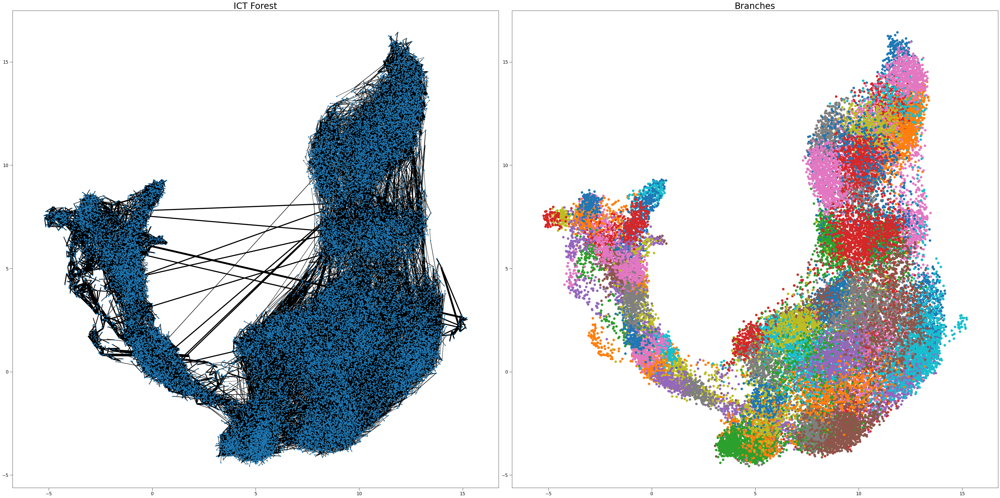

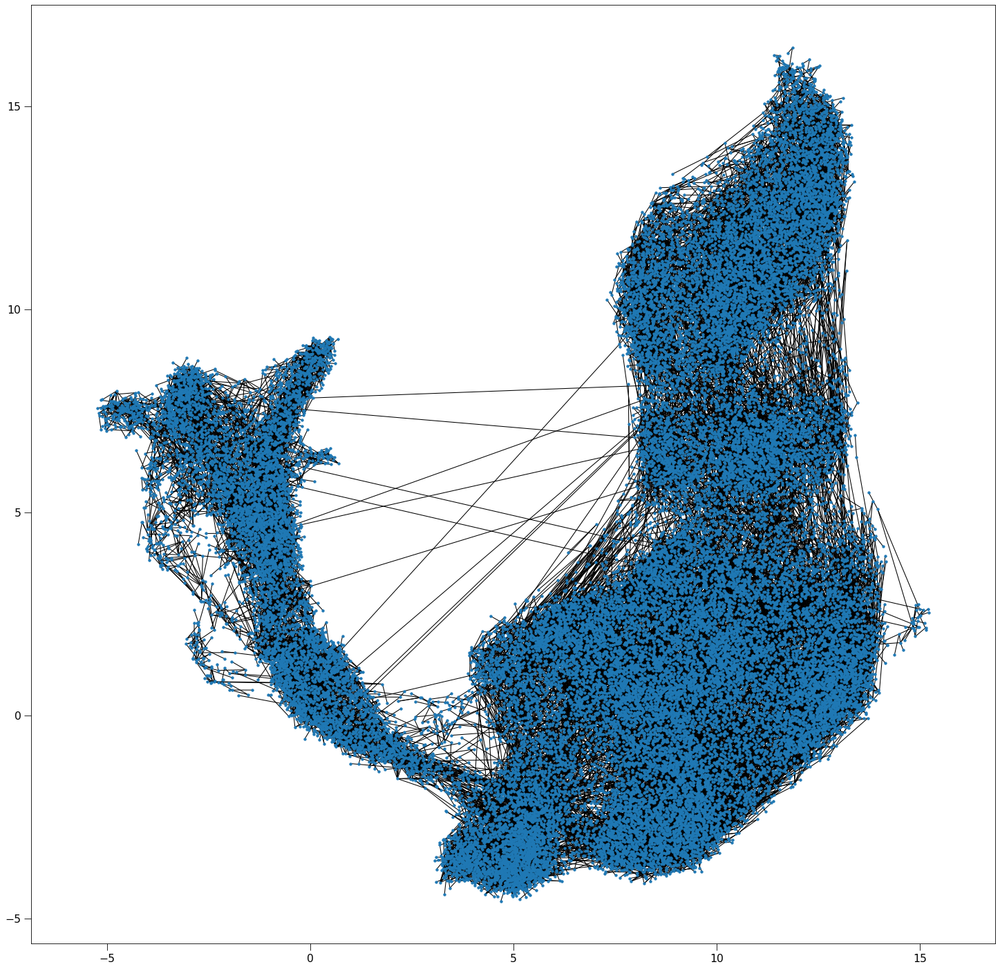

Patching the components together:   0%|          | 0/108 [00:00<?, ?it/s]

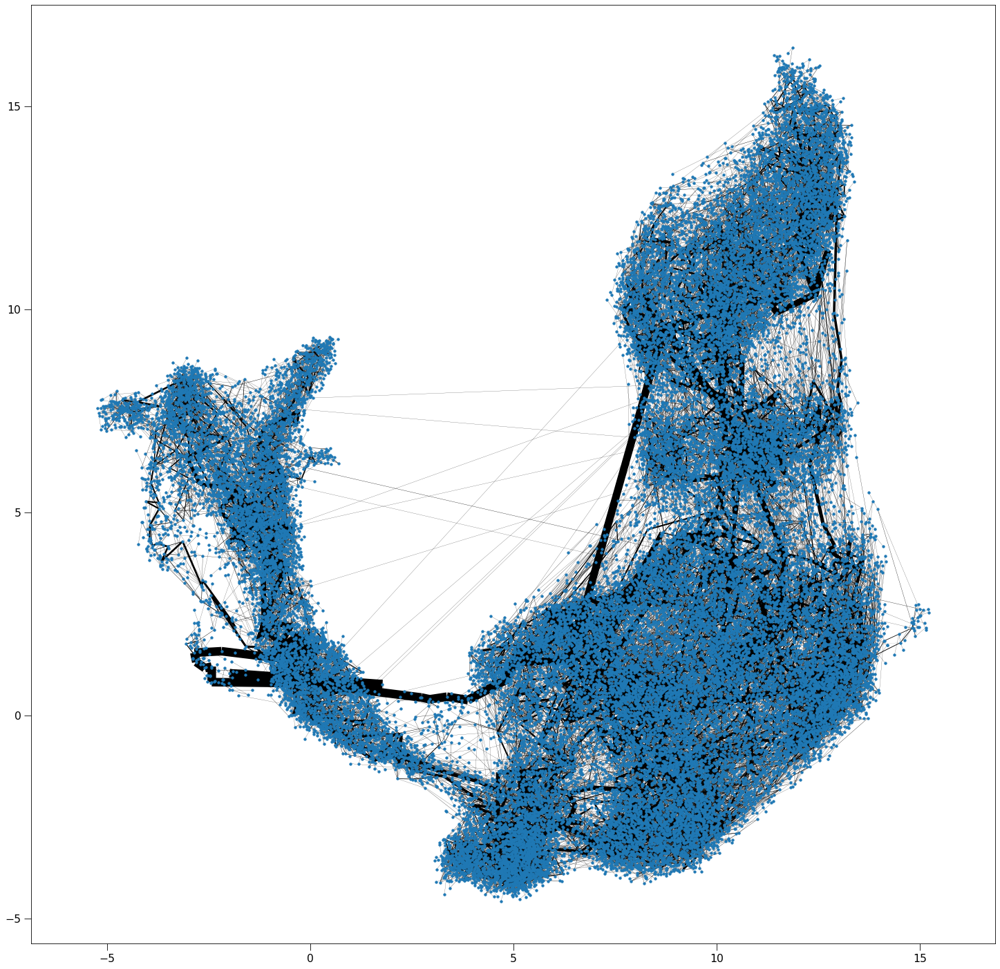

In [9]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()


##############################
           # new #           #
##############################
good_edges = []              #
for u, v in G.iterEdges():   #
    good_edges.append([u,v]) #
############################## 


G = patch_together(G, pca, 4)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [10]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1, good_edges=good_edges)
ICT.indexEdges()

create edgeId array:   0%|          | 0/36605 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/36605 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36350 [00:00<?, ?it/s]

update Arr 36605 -> 36360
update Arr 36360 -> 36359
update Arr 36359 -> 36358
update Arr 36358 -> 36358
update Arr 36358 -> 36358
update Arr 36358 -> 36358
update Arr 36358 -> 36358
update Arr 36358 -> 36358
update Arr 36358 -> 36358
update Arr 36358 -> 36358
update Arr 36358 -> 36358
update Arr 36358 -> 36358
update Arr 36358 -> 36357
update Arr 36357 -> 36357
update Arr 36357 -> 36355
update Arr 36355 -> 36355
update Arr 36355 -> 36354
update Arr 36354 -> 36353
update Arr 36353 -> 36353
update Arr 36353 -> 36353
update Arr 36353 -> 36353
update Arr 36353 -> 36351
update Arr 36351 -> 36351
update Arr 36351 -> 36351
update Arr 36351 -> 36350
added 8 edges early


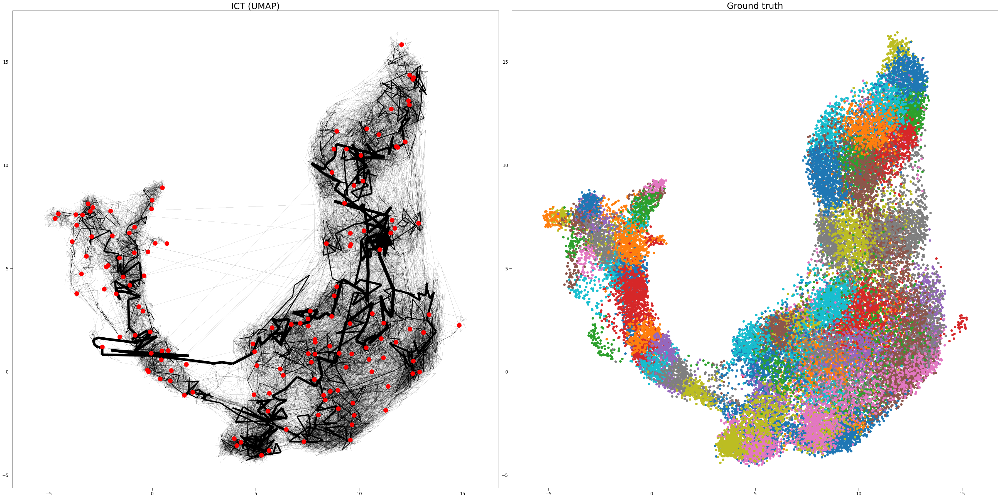

In [11]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

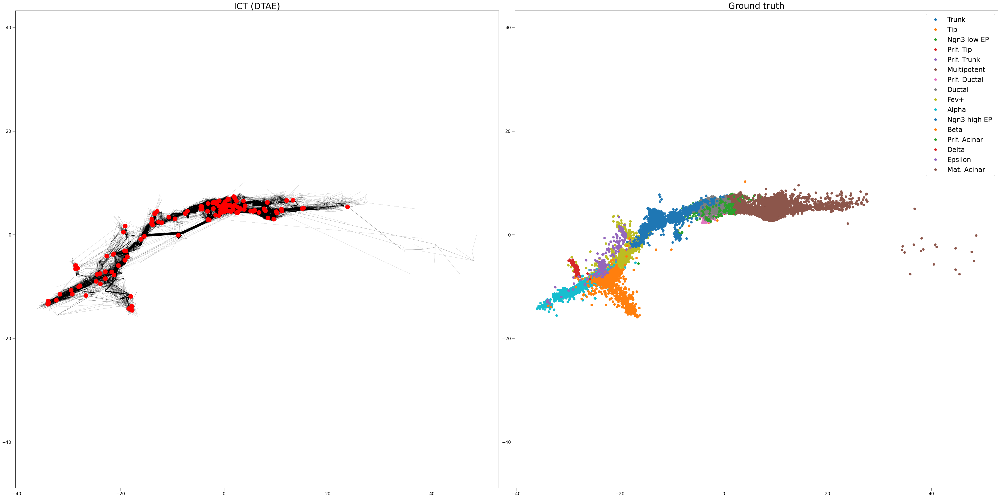

In [12]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

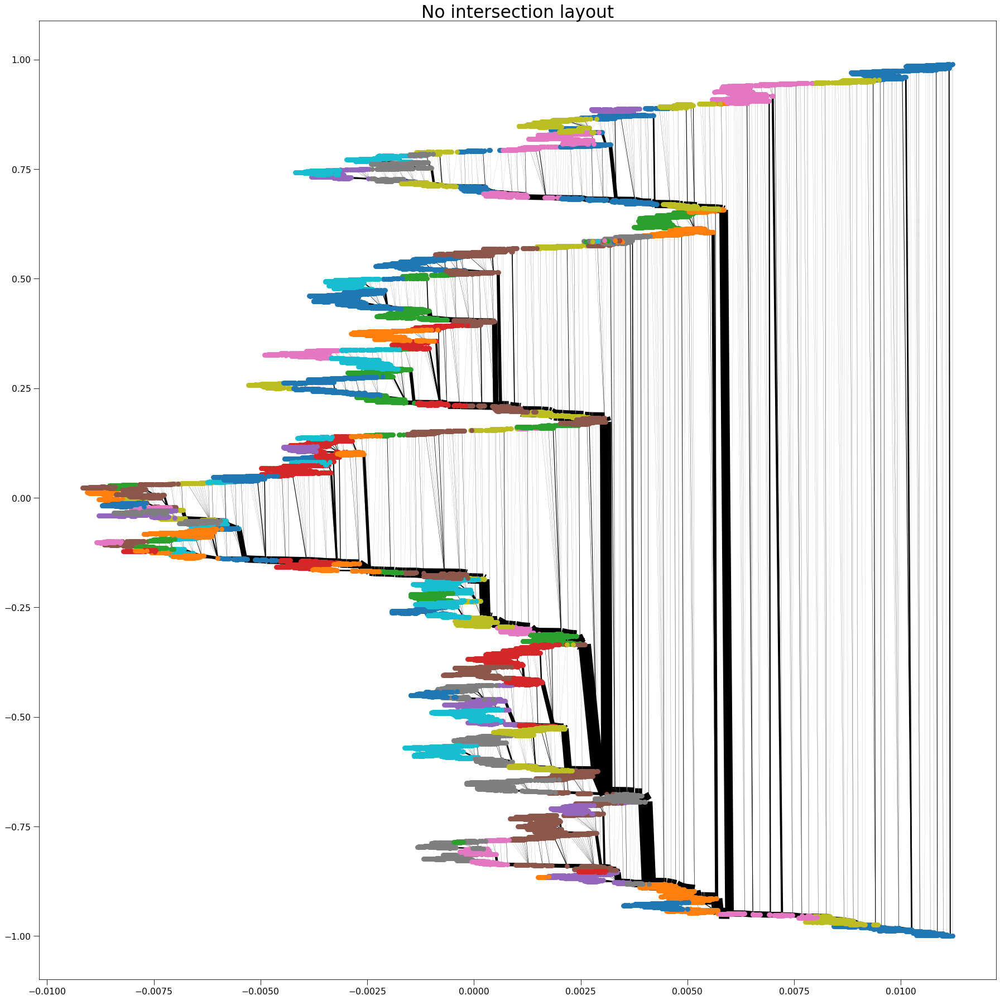

In [13]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()